## **프로젝트 1: Image Classification**

### **VGG16 모델**

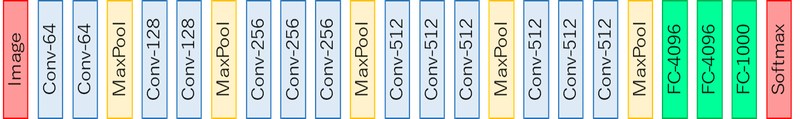

### **코드 살펴보기**

In [1]:
# 필요한 라이브러리 불러오기
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# 데이터 준비
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

불러온 데이터는 캐글에서 제공되는 개와 고양이의 데이터로, 개와 고양이를 분류할 예정이다.

In [3]:
# 이미지가 저장된 경로를 변수에 저장
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/aiffel/.keras/datasets/cats_and_dogs_filtered/train
/aiffel/.keras/datasets/cats_and_dogs_filtered/validation


In [4]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 
print(train_cats_dir)

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  
print(validation_dogs_dir)

/aiffel/.keras/datasets/cats_and_dogs_filtered/train/cats
/aiffel/.keras/datasets/cats_and_dogs_filtered/train/dogs
/aiffel/.keras/datasets/cats_and_dogs_filtered/validation/cats
/aiffel/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [5]:
# 데이터의 개수 알아보기
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [6]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [7]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

train 데이터가 2천장 밖에 되지 않기 때문에 Data Augmentation(데이터 증강)을 통해 데이터의 수를 늘린다.

In [8]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

파이프라인을 만들어 directory와 작업 환경을 연결시켜준다.

In [9]:
# directory와 작업 환경 연결
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary') # 개와 고양이를 분류하는 task

Found 2000 images belonging to 2 classes.


In [10]:
# Data Augmentation이 제대로 되었는지 확인
train_data_gen[0][0].shape

(16, 256, 256, 3)

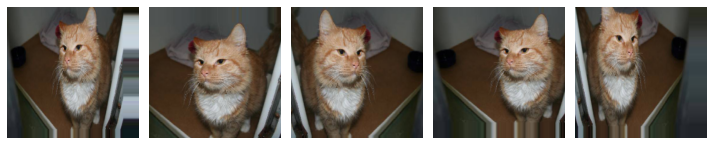

In [11]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

Validation 데이터에도 train 데이터와 같은 동일한 작업을 진행한다.  
그러나 Validation 데이터는 classification이 잘 되는지 평가하는 용도로 사용되기 때문에 데이터의 스케일만 변경해준다.

In [12]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [13]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


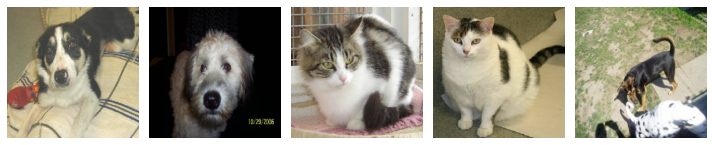

In [14]:
# Validation 데이터 확인
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [15]:
_[:5] # 정답 데이터

array([1., 1., 0., 0., 1.], dtype=float32)

Validation 데이터는 크게 이미지와 정답 데이터로 구성이 되어 있다.

#### **문제 1-1. VGG16 모델 구현하기**

In [16]:
# 문제 1-1. 모델 구현
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(1024, activation='relu')(x)
x=tf.keras.layers.Dense(512, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 256, 256, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 64)      18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 128, 128, 64)      36928 

In [17]:
loss_function = tf.keras.losses.binary_crossentropy
optimize = tf.keras.optimizers.Adam(learning_rate=0.01)
metric = tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [18]:
# 모델 학습
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/5
125/125 [==============================] - 38s 260ms/step - loss: 47.0039 - binary_accuracy: 0.5140 - val_loss: 0.6942 - val_binary_accuracy: 0.4980
Epoch 2/5
125/125 [==============================] - 31s 248ms/step - loss: 0.7246 - binary_accuracy: 0.5445 - val_loss: 0.6967 - val_binary_accuracy: 0.5600
Epoch 3/5
125/125 [==============================] - 31s 249ms/step - loss: 0.7037 - binary_accuracy: 0.5505 - val_loss: 0.6836 - val_binary_accuracy: 0.5600
Epoch 4/5
125/125 [==============================] - 31s 248ms/step - loss: 0.6940 - binary_accuracy: 0.5485 - val_loss: 0.6836 - val_binary_accuracy: 0.5680
Epoch 5/5
125/125 [==============================] - 33s 267ms/step - loss: 0.6953 - binary_accuracy: 0.4980 - val_loss: 0.6932 - val_binary_accuracy: 0.4990


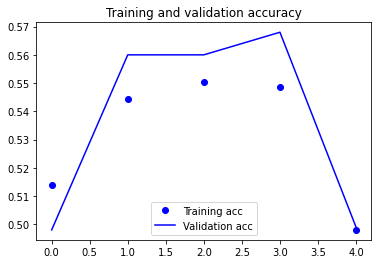

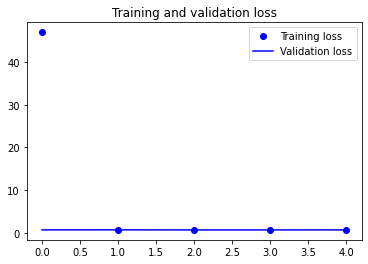

In [19]:
# 시각화
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

성능이 그리 좋지 않은 것을 확인할 수 있다.

#### **문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기**

In [20]:
# 문제 1-2. hyperparameter 설정
batch_size = 64
epochs = 10
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [21]:
# 문제 1-2. 데이터 generator 생성
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=20,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False,
                                     fill_mode='nearest')

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [22]:
# Data Augmentation이 제대로 되었는지 확인
train_data_gen[0][0].shape

(64, 256, 256, 3)

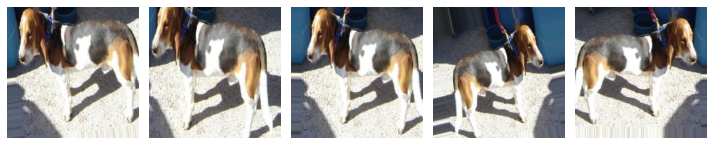

In [23]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [24]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


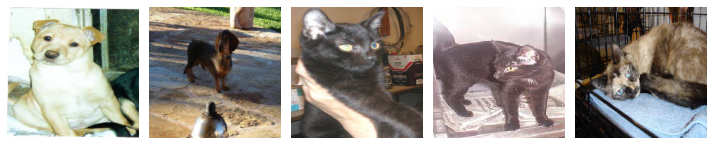

In [25]:
# Validation 데이터 확인
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [26]:
_[:5] # 정답 데이터

array([1., 1., 0., 0., 0.], dtype=float32)

In [27]:
# 문제 1-2. 모델 구현
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model

# VGG16 모델 불러오기
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# 추가적인 층 정의
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
output = Dense(1, activation='sigmoid')(x)

# 전체 모델 정의
model = Model(inputs=base_model.input, outputs=output)

# 사전 훈련된 층 동결
for layer in base_model.layers:
    layer.trainable = False
    
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [28]:
# 문제 1-2. loss function, optimizer, metric 설정 및 모델 컴파일
loss_function = tf.keras.losses.binary_crossentropy
optimize = tf.keras.optimizers.Adam(learning_rate=0.001)
metric = tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [29]:
# 모델 학습
early_stopping_cb = EarlyStopping(patience=6,
                                  monitor='val_loss',
                                  restore_best_weights=True)
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir))) / batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1,
      callbacks=[early_stopping_cb])

Epoch 1/10
31/31 [==============================] - 60s 2s/step - loss: 1.4487 - binary_accuracy: 0.6835 - val_loss: 0.3580 - val_binary_accuracy: 0.8300
Epoch 2/10
31/31 [==============================] - 37s 1s/step - loss: 0.3027 - binary_accuracy: 0.8675 - val_loss: 0.2598 - val_binary_accuracy: 0.8840
Epoch 3/10
31/31 [==============================] - 36s 1s/step - loss: 0.2442 - binary_accuracy: 0.9035 - val_loss: 0.2002 - val_binary_accuracy: 0.9180
Epoch 4/10
31/31 [==============================] - 37s 1s/step - loss: 0.2219 - binary_accuracy: 0.9075 - val_loss: 0.1903 - val_binary_accuracy: 0.9200
Epoch 5/10
31/31 [==============================] - 36s 1s/step - loss: 0.2054 - binary_accuracy: 0.9165 - val_loss: 0.2942 - val_binary_accuracy: 0.8630
Epoch 6/10
31/31 [==============================] - 37s 1s/step - loss: 0.2301 - binary_accuracy: 0.8990 - val_loss: 0.1881 - val_binary_accuracy: 0.9180
Epoch 7/10
31/31 [==============================] - 37s 1s/step - loss: 0.17

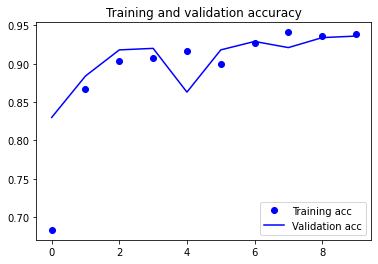

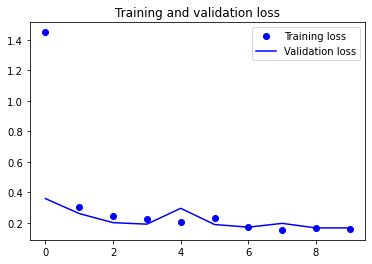

In [30]:
# 시각화
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## **프로젝트 2: Object Detection**

### **RCNN vs Fast R-CNN vs Faster R-CNN**
* 2 stage detector(Region Proposal, Classification/Bounding Box Regression)

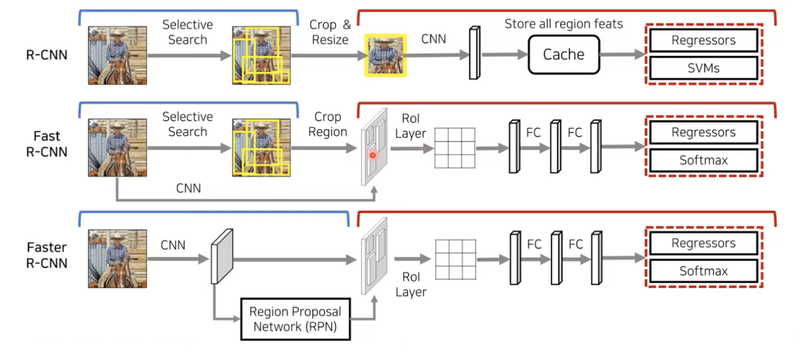

### **Faster RCNN의 구조**
* RCNN, Fast RCNN과 Faster RCNN의 가장 큰 차이점은 Selective Search를 Region Proposal Network(RPN)로 바꾸었다는 것이다.
* RPN은 RoI가 될 후보군인 Anchor Box를 무수히 만든 뒤에 Bounding Box Regression를 통해서 괜찮은 RoI를 딥러닝을 통해 학습하고 Classification을 통해 그것이 Object인지 아닌지를 판단한다.
* RPN을 통해 얻은 결과에 Object Classification을 통해서 해당 RoI에 있는 Object가 어떤 Class인지 구분하고, Bounding Box Regression을 실행한다.

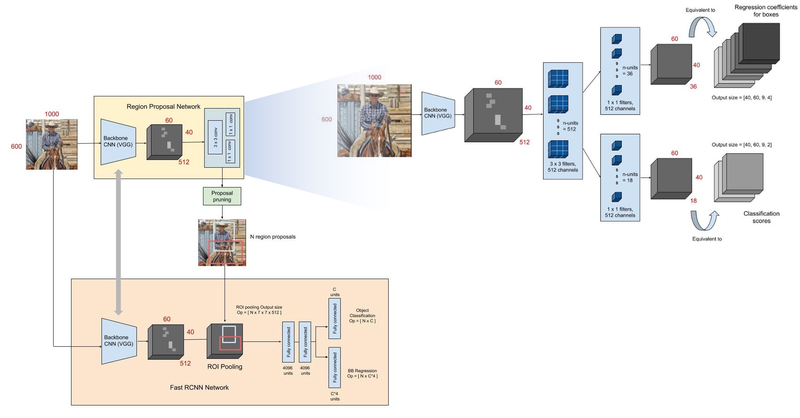

### **코드 살펴보기**

In [31]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [32]:
# 이미지를 시각화하기 위한 함수
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [33]:
# 원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") # RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [34]:
# Bounding Box를 만드는 함수
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [35]:
#이미지 위에 class 이름과 score를 나타내는 함수
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmptbketdwz.jpg.


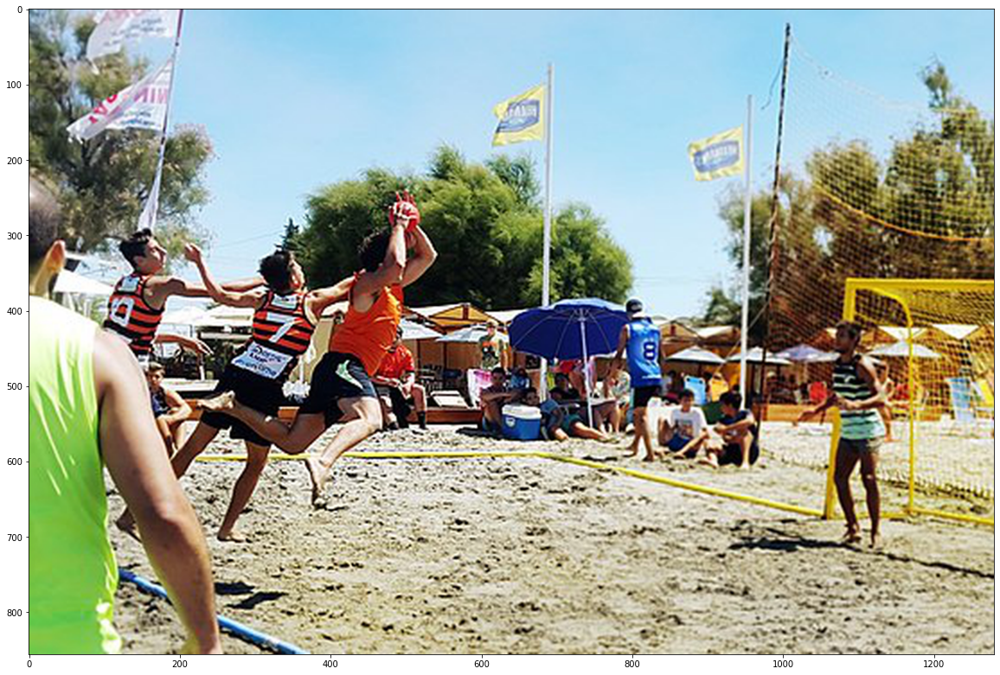

In [36]:
# 이미지 불러오기
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [37]:
# Pre-trained Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  
detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [38]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [39]:
# Detector를 실행하는 함수
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  37.081772565841675


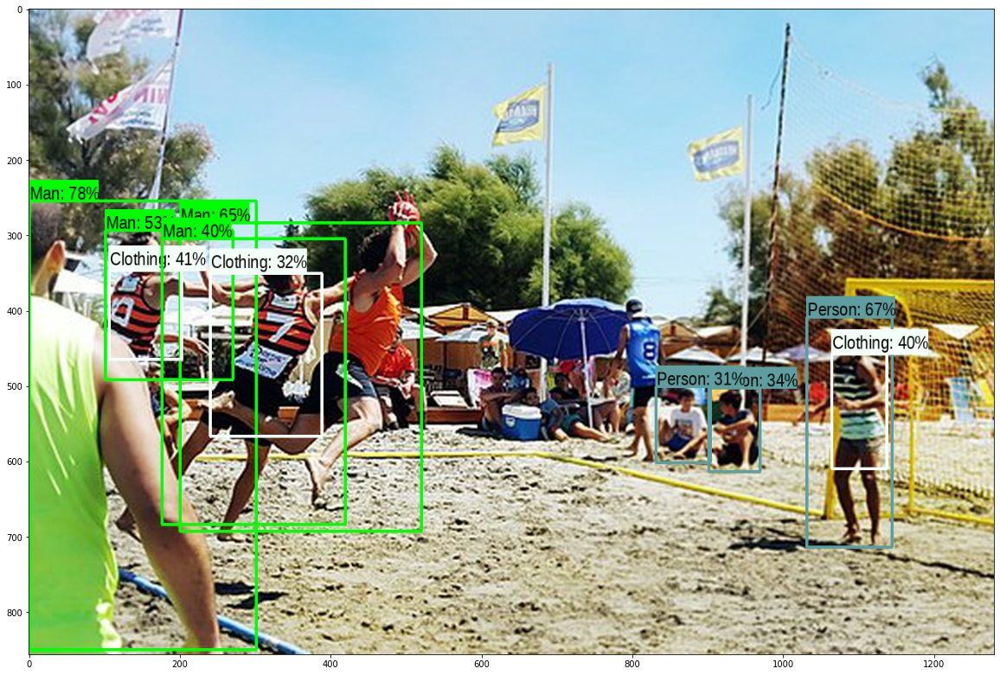

In [40]:
# Detector 실행
run_detector(detector, downloaded_image_path)

#### **문제 2-1. 다른 이미지 테스트해보기**

Image downloaded to /tmp/tmpe1p9d7vg.jpg.


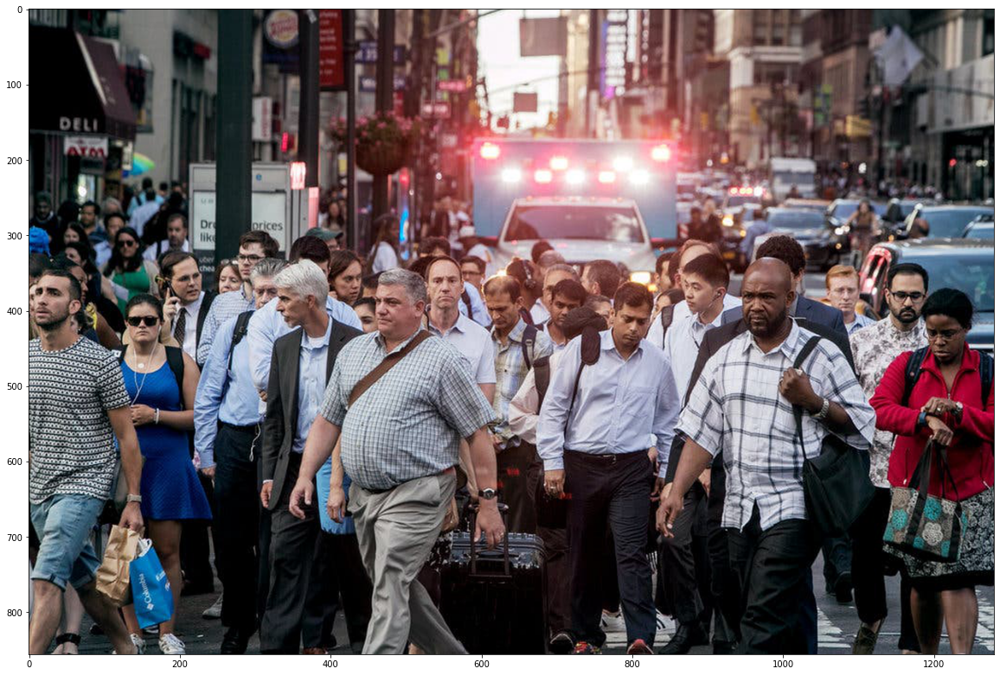

In [41]:
# 문제 2-1. 이미지 불러오기
image_url = "https://static01.nyt.com/images/2016/06/28/nyregion/00SIDEWALKS1sub/00SIDEWALKS1sub-jumbo.jpg?quality=75&auto=webp"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

Found 100 objects.
Inference time:  1.398820400238037


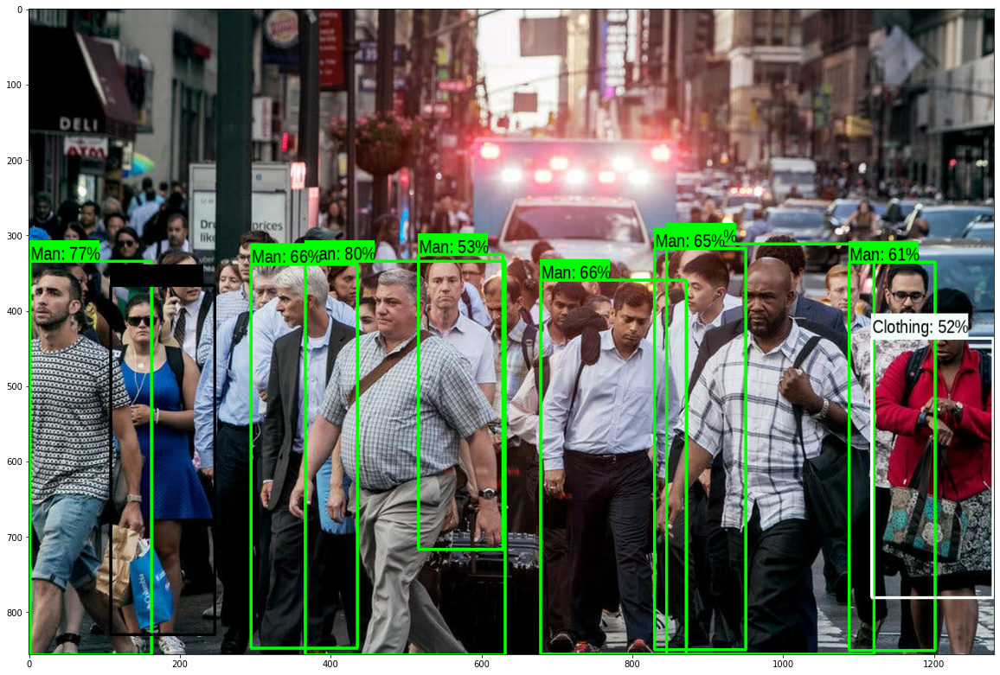

In [42]:
# 문제 2-1. 테스트
run_detector(detector, downloaded_image_path)

#### **문제 2-2. 다양한 pre-trained model 테스트해보기**

In [43]:
# 문제 2-2. 모델 불러오기 (Pre-trained SSD)
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  5.883991241455078


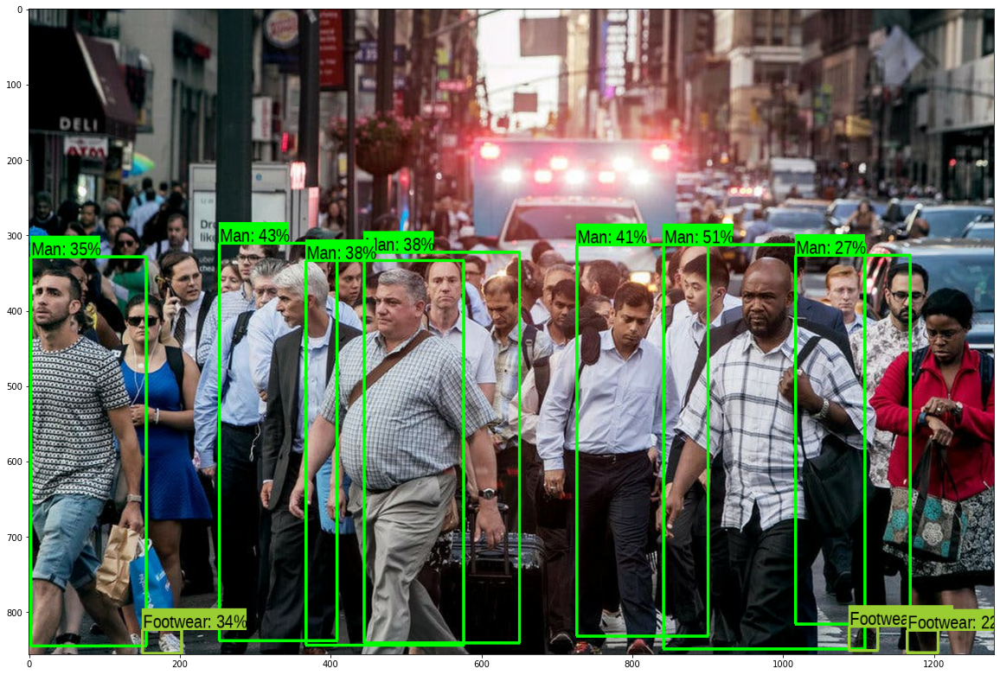

In [44]:
# 문제 2-2. 테스트 
run_detector(detector, downloaded_image_path)

In [46]:
# 문제 2-2. 결과 비교
print("1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.") 
print("2번째 모델인 MobileNet을 사용한 SSD는 Faster RCNN에 비해 상대적으로 더 느리고 낮은 정확도를 보였습니다.")

1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.
2번째 모델인 MobileNet을 사용한 SSD는 Faster RCNN에 비해 상대적으로 더 느리고 낮은 정확도를 보였습니다.


---

### **프로젝트 회고**

이번 프로젝트는 시간이 많아서 조금 더 여유있게 학습할 수 있었던 것 같다. 첫번째 프로젝트의 경우 성능을 높이기 위해서 이것저것 시도해봤는데, 최종적으로는 영상에서 추천해준대로 pre-trained 모델을 사용했을 때 가장 성능이 좋았고, 거기에 추가로 하이퍼파라미터를 조정해주니 정확도가 조금 더 상승한 모습을 확인할 수 있었다. 테스트 데이터가 없어서 루브릭에서 말하는 accuracy 53% 이상이라는 게 어떤 걸 기준으로 말하는 건지 헷갈렸는데, 테스트 데이터가 없는 경우에는 주로 검증 데이터를 사용한다고 하니 아마도 마지막 epoch의 val_binary_accuracy를 기준으로 성능을 평가하는 것이 아닐까 싶다. 따라서 훈련이 끝난 후 마지막 epoch의 val_binary_accuracy가 약 94%이니 성공적이였다고 볼 수 있지 않을까? 또한 해당 프로젝트를 진행하면서 그래프를 해석하는 방법에 대해서 많이 찾아봤던 것 같은데 이 부분은 조금 더 공부가 필요하다고 느꼈다.

두번째 프로젝트는 코드도 이미 다 주어져 있었고 단순히 다른 모델을 사용해보는 프로젝트였어서 빠른 시간 내에 완료할 수 있었다. 생각보다 어려웠던 건 마땅한 이미지를 찾기가 쉽지 않았던 거였고 (많은 object가 있는 사진을 찾고 싶었다), 또한 위의 두 모델 말고 다른 모델을 사용해보려고 했을 때는 에러가 발생했다는 점이다. Detector를 실행하는 함수 내의 float32을 uint8로 변경해야 하는데 그럴 경우 이전 모델에 지장을 줄 수 있을 것 같아 그냥 SSD만 사용해보기로 결정했다.

**여기서 한가지 의문점❗**  
보통 Faster RCNN의 경우 두 단계의 네트워크 구조로 이루어져 있어 정확도가 높지만 상대적으로 느리고, SSD는 빠른 속도를 보이는 대신 RCNN보다 정확도는 상대적으로 낮을 수 있다는데 왜 나의 SSD 모델은 RCNN에 비해 더 느릴까❓🧐

🌠학습 속도 항샹을 위해 GPU를 사용해보려고 했는데 기본 Windows에서 GPU 지원은 TF 2.10 이하 버전에서만 사용할 수 있다고 해서 실패 (현재 버전 2.12) 드라이버도 최신인데 아무래도 주말에 다운그레이드를 시도해봐야 할 것 같다.

#### **새로 알게 된 것!**
**signature는 무엇인가?**
* 시그니처(signature)는 모델이 수행할 수 있는 특정 작업 또는 함수를 나타낸다.
* TensorFlow Hub의 모델은 여러 개의 시그니처를 가질 수 있으며, 모델을 호출할 때 해당 시그니처의 기능을 사용할 수 있다.
* 보통 'default'라는 이름의 시그니처가 있지만, 모델에 따라 다른 시그니처도 있을 수 있다.
* 각 시그니처는 모델의 다른 기능을 나타내며, 호출 시 해당 시그니처를 명시적으로 지정해야 한다.

그리고 그 외에 정의된 수많은 함수들,,, 나중에 갖다 써먹어야지 ;)

**참고한 레퍼런스**
<br>TensorFlow Hub https://tfhub.dev/
<br>TensorFlow Core https://www.tensorflow.org/guide/keras/transfer_learning?hl=ko
<br>12. 고양이와 개 이미지 분류하기https://codetorial.net/tensorflow/classifying_the_cats_and_dogs.html
<br>사전 훈련된 CNN 사용하기 (Using a pretrained CNN) https://foxtrotin.tistory.com/486
<br>CNN 사전학습 모델을 이용한 이미지 분류 https://yeong-jin-data-blog.tistory.com/entry/%EC%82%AC%EC%A0%84%ED%95%99%EC%8A%B5-%EB%AA%A8%EB%8D%B8-%EC%82%AC%EC%9A%A9